In [1]:
import numpy as np
import matplotlib.pyplot as plt
import os
import cv2

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Activation, Flatten, Conv2D, MaxPooling2D
import pickle


img_width, img_height = 640, 480

# training path
DATADIR = "/Users/crisramos/Desktop/Deep Learning/Project FArmerINsurance/imgs/train"
categories= [ 'c0','c1','c2','c3','c4','c5','c6','c7','c8','c9']

for category in categories:
    path  = os.path.join(DATADIR, category)
    for img in os.listdir(path):
        print(path,img)
        img_array=cv2.imread(os.path.join(path,img), cv2.IMREAD_GRAYSCALE)
        #plt.imshow(img_array[...,::-1])

        plt.imshow(img_array,cmap="gray")
        plt.show()
        break
    break



#307200 size of pics




/anaconda3/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


/Users/crisramos/Desktop/Deep Learning/Project FArmerINsurance/imgs/train/c0 img_46818.jpg


<Figure size 640x480 with 1 Axes>

In [2]:
print(img_array)
#IMG_SIZE = 480*640 

[[68 67 67 ... 45 56 91]
 [70 69 69 ... 76 73 69]
 [72 71 71 ... 86 78 74]
 ...
 [ 5  5  5 ... 15 15 14]
 [ 5  5  5 ... 14 15 16]
 [ 5  5  5 ... 13 15 17]]


In [3]:
training_data = []
def create_td():
    for category in categories:
        path  = os.path.join(DATADIR, category)
        class_num = categories.index(category)
        i=0
        for img in os.listdir(path):
            img_array=cv2.imread(os.path.join(path,img), cv2.IMREAD_GRAYSCALE)
            #img_array =cv2.resize(img_array,(480,640))
            training_data.append([img_array,class_num])
            i+=1
            if i> 1500:
                break
    
            

        
        
        
        

In [4]:
create_td()
print(len(training_data))

15010


In [5]:
import random
random.shuffle(training_data)
for sample in training_data[:10]:
    print(sample[1])

9
8
4
5
5
6
5
3
7
2


In [6]:
X= []
y=[]
for features, label in training_data:
    X.append(features)
    y.append(label)
    
X= np.array(X).reshape(-1, 480,640,1)  #if its color 1 has tobe 3!!! 


In [7]:
from keras.utils import np_utils
y = np_utils.to_categorical(y, 10)
X = X/255


Using TensorFlow backend.


In [53]:
print(X.shape[1:])

(480, 640, 1)


In [8]:
print(y[0])

[0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]


In [9]:
print("ready to train")

ready to train


In [37]:

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Activation, Flatten, Conv2D, MaxPooling2D
from sklearn import preprocessing

model=Sequential()

In [38]:
# 1 conv layer  480 -3 +1 / 3 + 1= 120
model.add(   Conv2D(32,(3,3),input_shape= X.shape[1:],strides=4)  )
model.add(Activation("relu"))
print(model.output_shape)
# pool layer 1
model.add(MaxPooling2D(pool_size= (3,3)))
print(model.output_shape)




(None, 120, 160, 32)
(None, 40, 53, 32)


In [39]:

# 2 Conv layer
model.add(Conv2D(32,(3,3),strides=1,padding='same'))
model.add(Activation("relu"))
print(model.output_shape)

# pooling layer 2
model.add(MaxPooling2D(pool_size= (3,3),strides=2))
print(model.output_shape)
#Dropout layer to avoid overfiiting


(None, 40, 53, 32)
(None, 19, 26, 32)


In [40]:


# 3 Conv layer
model.add(Conv2D(32,(3,3),strides=1,padding='same'))
model.add(Activation("relu"))
print(model.output_shape)

# pooling layer 3
model.add(MaxPooling2D(pool_size= (3,3),strides=2))
print(model.output_shape)

model.add(Dropout(0.25))


(None, 19, 26, 32)
(None, 9, 12, 32)


In [41]:
# Dropout layer to avoid overfiiting




model.add(Flatten())
print(model.output_shape)
model.add(Dense(528))
model.add(Activation("relu"))
print(model.output_shape)


model.add(Dropout(0.5))


model.add(Dense(10))
model.add(Activation('softmax'))
print(model.output_shape)


(None, 3456)
(None, 528)
(None, 10)


In [42]:
from keras.metrics import categorical_accuracy


model.compile(loss="categorical_crossentropy",
             optimizer="adam",
             metrics=["accuracy"])

print(model.summary())

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_9 (Conv2D)            (None, 120, 160, 32)      320       
_________________________________________________________________
activation_15 (Activation)   (None, 120, 160, 32)      0         
_________________________________________________________________
max_pooling2d_9 (MaxPooling2 (None, 40, 53, 32)        0         
_________________________________________________________________
conv2d_10 (Conv2D)           (None, 40, 53, 32)        9248      
_________________________________________________________________
activation_16 (Activation)   (None, 40, 53, 32)        0         
_________________________________________________________________
max_pooling2d_10 (MaxPooling (None, 19, 26, 32)        0         
_________________________________________________________________
conv2d_11 (Conv2D)           (None, 19, 26, 32)        9248      
__________

In [43]:
from time import time
import time
name= "convNN 2 conv 2pools layers 480 640".format(int(time.time()))

from tensorflow.keras.callbacks import TensorBoard
tensorboard = TensorBoard(log_dir="logs/{}".format(name), batch_size = 32, update_freq= 'batch',write_graph=True)



In [44]:
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.callbacks import ReduceLROnPlateau


es = EarlyStopping(monitor='val_loss', mode='min', verbose=1)

reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5,
                              patience=0, min_lr=0.001)


fitted_model= model.fit(X,y, epochs= 3, validation_split=.1,
                        batch_size=32, verbose= 1,callbacks =[es,tensorboard,reduce_lr])

Train on 13509 samples, validate on 1501 samples
Epoch 1/3
13509/13509 [==============================] - 1727s 128ms/sample - loss: 1.1920 - acc: 0.5860 - val_loss: 0.2377 - val_acc: 0.9374
Epoch 2/3
13509/13509 [==============================] - 1732s 128ms/sample - loss: 0.2919 - acc: 0.9081 - val_loss: 0.1126 - val_acc: 0.9660
Epoch 3/3
13509/13509 [==============================] - 1581s 117ms/sample - loss: 0.1659 - acc: 0.9473 - val_loss: 0.0769 - val_acc: 0.9800


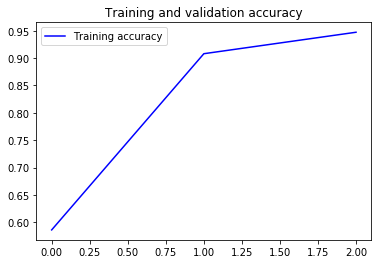

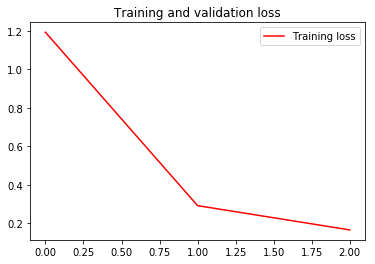

In [45]:



import matplotlib.pyplot as plt

%matplotlib inline

accuracy = fitted_model.history['acc']
#val_accuracy = history.history['val_acc']
loss = fitted_model.history['loss']
#val_loss = history.history['val_loss']
epochs = range(len(accuracy))
plt.plot(epochs, accuracy, 'b-', label='Training accuracy')
#plt.plot(epochs, val_accuracy, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend()
plt.figure()
plt.plot(epochs, loss, 'r-', label='Training loss')
#plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
# plt.show()





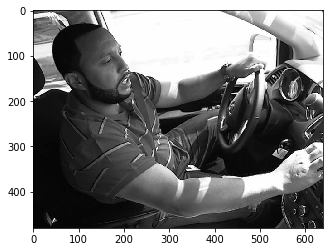

   Prediction =  operating the radio


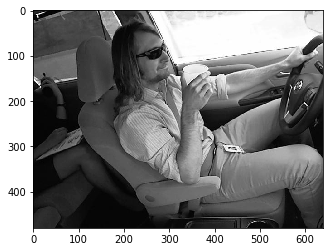

   Prediction =  operating the radio


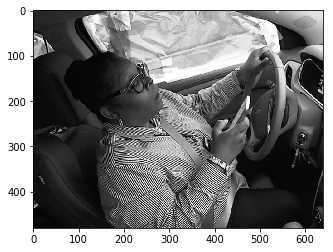

   Prediction =  texting - right


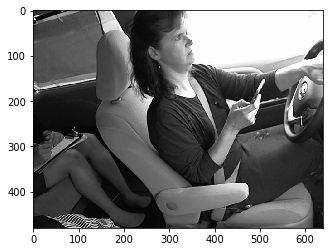

   Prediction =  reaching behind


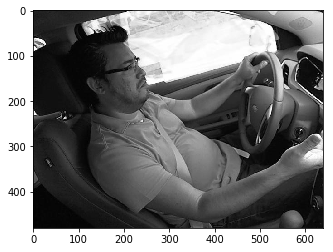

   Prediction =  operating the radio


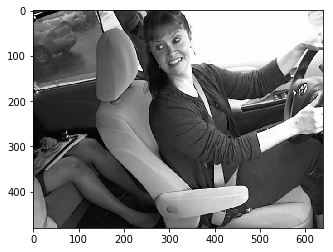

   Prediction =  talking on the phone - left


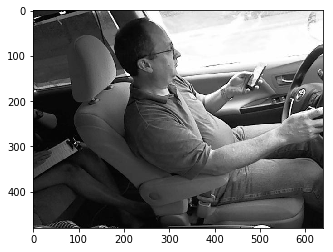

   Prediction =  operating the radio


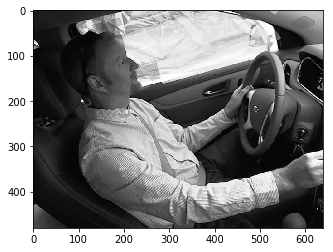

   Prediction =  operating the radio


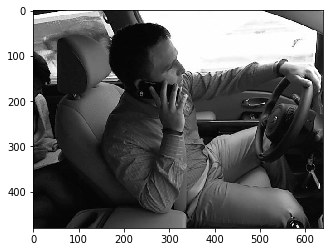

   Prediction =  talking on the phone - left


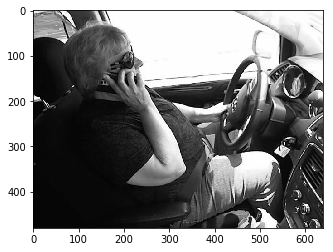

   Prediction =  hair and makeup


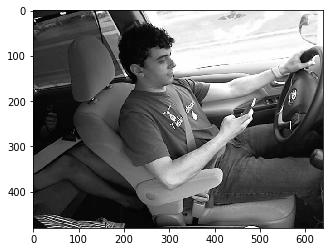

   Prediction =  texting - right


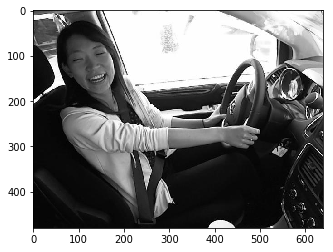

   Prediction =  texting - left


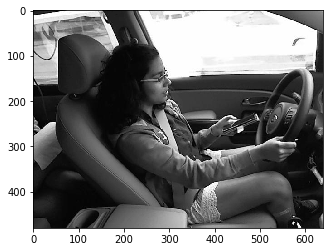

   Prediction =  texting - left


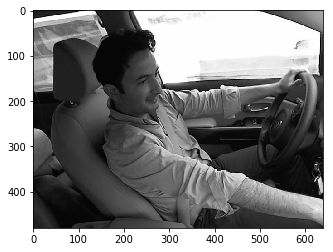

   Prediction =  operating the radio


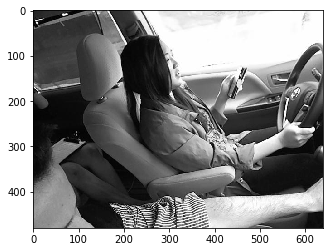

   Prediction =  operating the radio


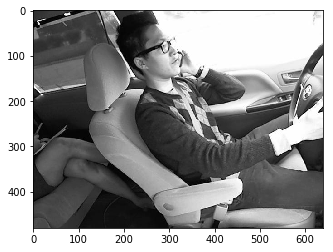

   Prediction =  talking on the phone - left


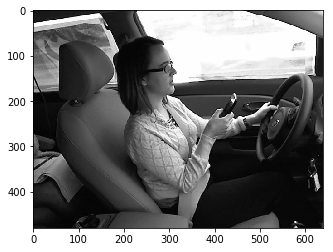

   Prediction =  texting - right


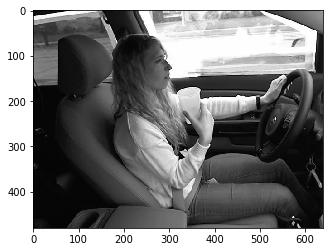

   Prediction =  reaching behind


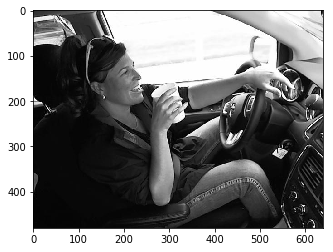

   Prediction =  drinking


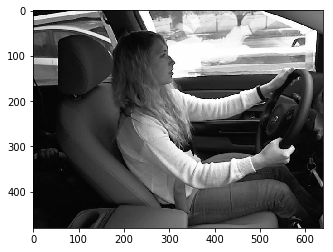

   Prediction =  talking to passenger


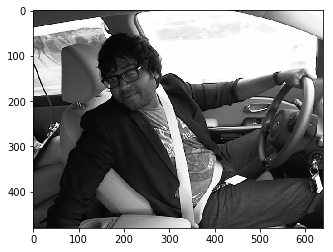

   Prediction =  reaching behind


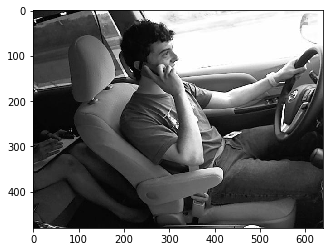

   Prediction =  talking on the phone - right


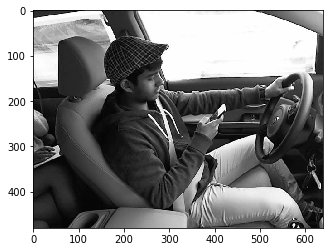

   Prediction =  texting - right


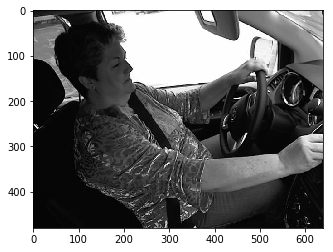

   Prediction =  hair and makeup


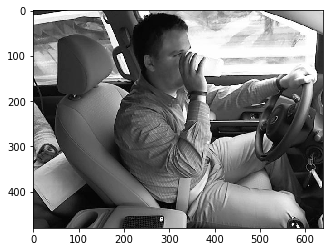

   Prediction =  talking on the phone - left


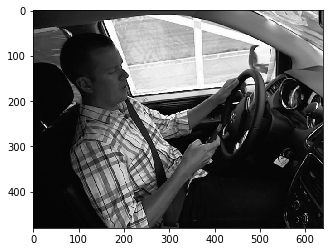

   Prediction =  reaching behind


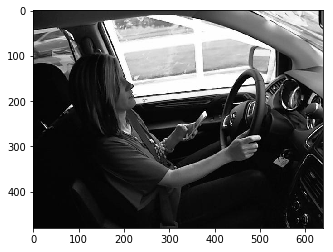

   Prediction =  texting - left


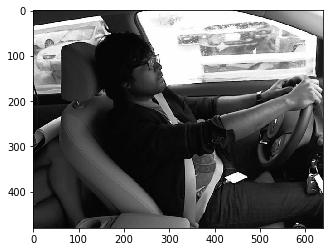

   Prediction =  hair and makeup


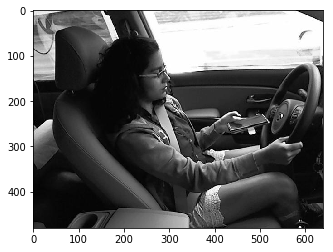

   Prediction =  texting - left


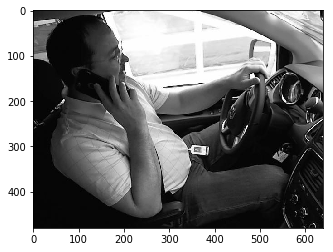

   Prediction =  hair and makeup


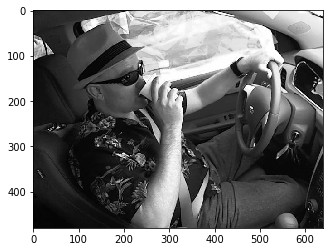

   Prediction =  reaching behind


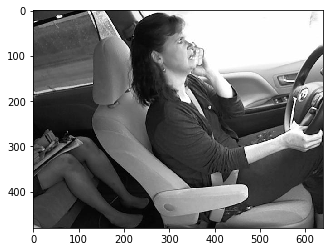

   Prediction =  talking on the phone - left


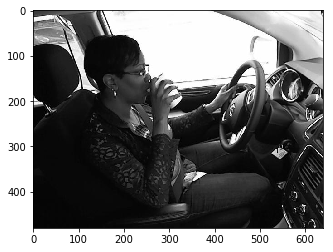

   Prediction =  drinking


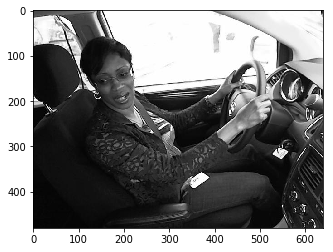

   Prediction =  talking to passenger


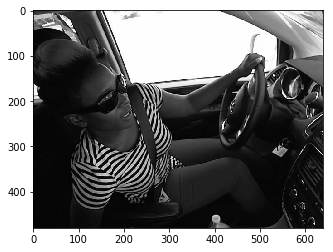

   Prediction =  reaching behind


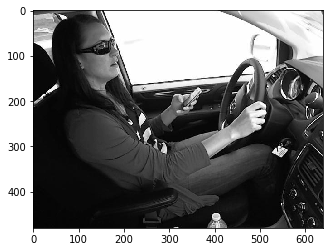

   Prediction =  texting - left


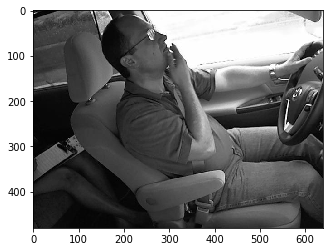

   Prediction =  hair and makeup


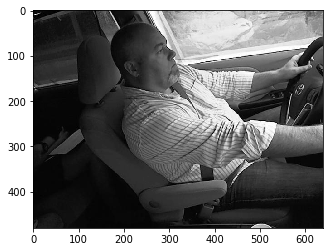

   Prediction =  texting - left


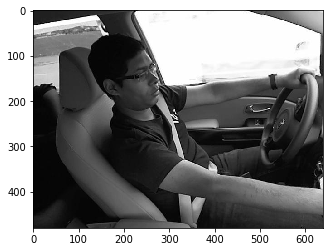

   Prediction =  operating the radio


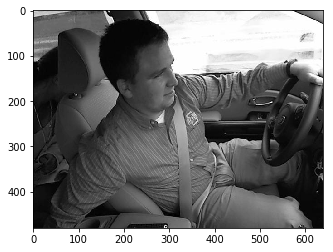

   Prediction =  reaching behind


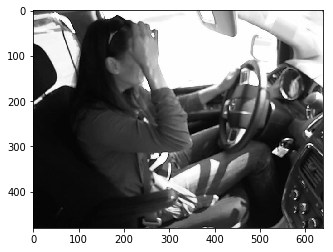

   Prediction =  hair and makeup


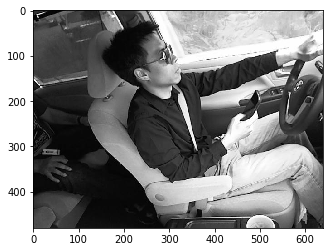

   Prediction =  drinking


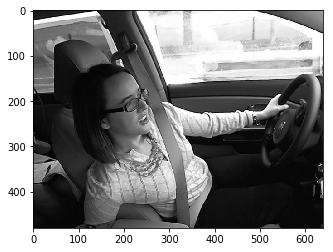

   Prediction =  reaching behind


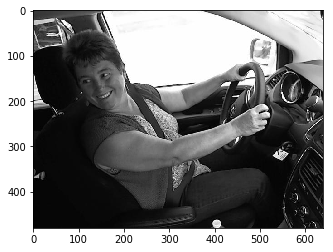

   Prediction =  safe driving


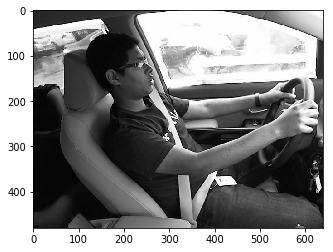

   Prediction =  hair and makeup


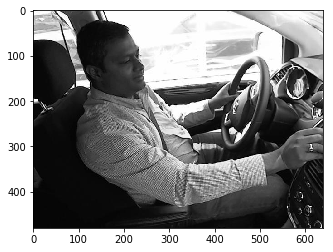

   Prediction =  operating the radio


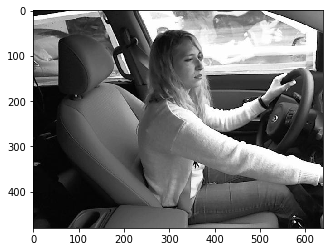

   Prediction =  operating the radio


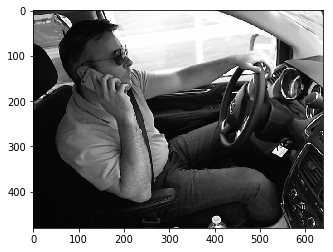

   Prediction =  hair and makeup


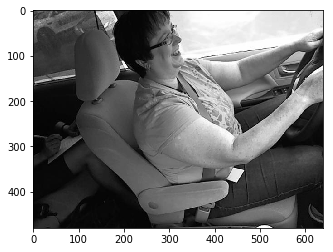

   Prediction =  texting - left


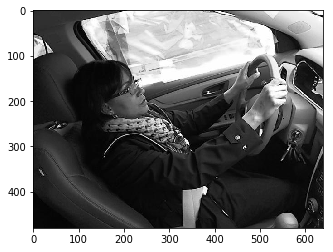

   Prediction =  talking on the phone - right


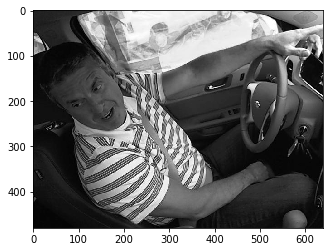

   Prediction =  reaching behind


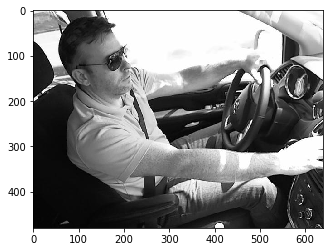

   Prediction =  operating the radio


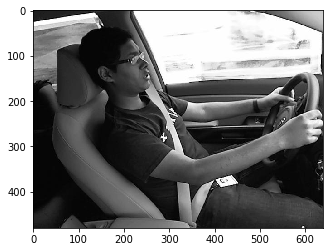

   Prediction =  talking to passenger


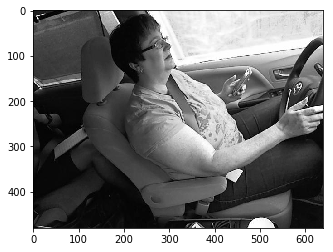

   Prediction =  texting - left


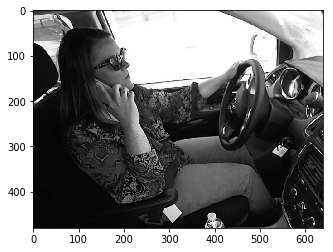

   Prediction =  talking on the phone - right


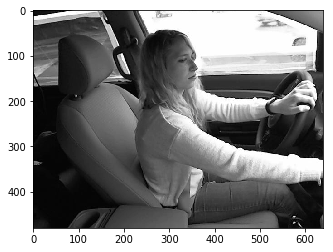

   Prediction =  operating the radio


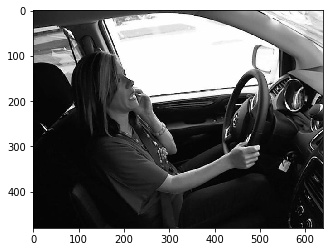

   Prediction =  talking to passenger


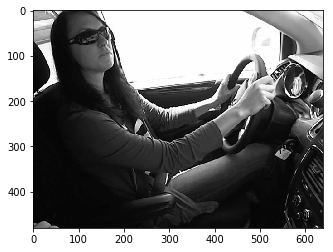

   Prediction =  safe driving


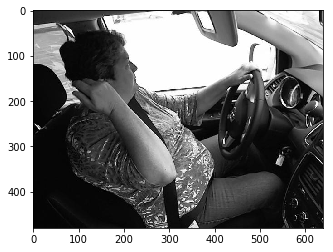

   Prediction =  hair and makeup


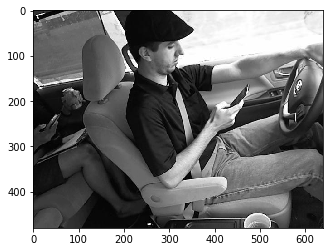

   Prediction =  texting - left


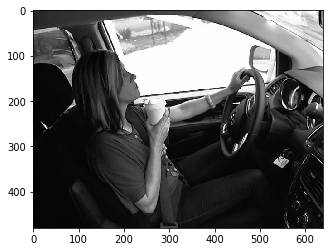

   Prediction =  reaching behind


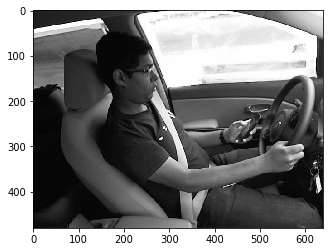

   Prediction =  talking on the phone - right


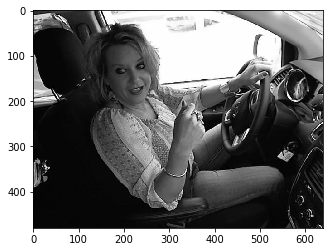

   Prediction =  drinking


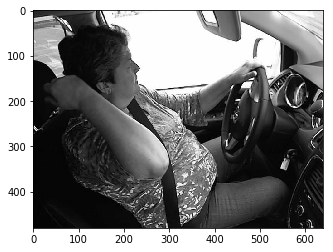

   Prediction =  hair and makeup


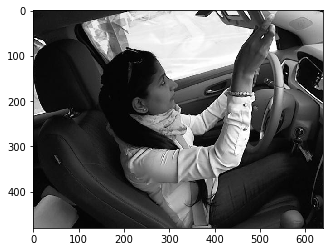

   Prediction =  hair and makeup


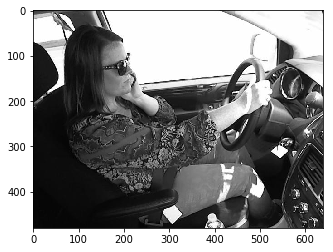

   Prediction =  talking to passenger


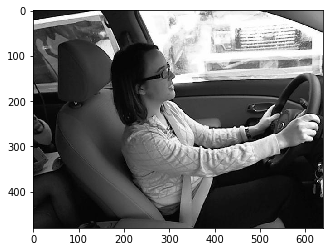

   Prediction =  texting - left


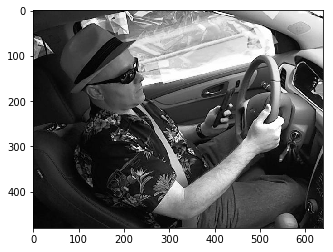

   Prediction =  texting - left


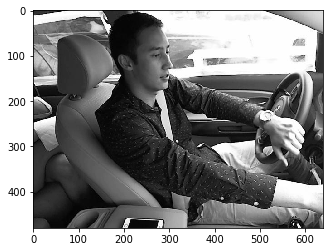

   Prediction =  texting - left


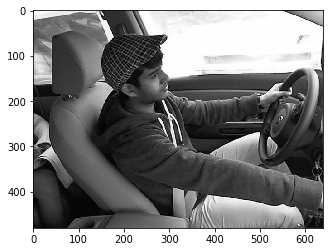

   Prediction =  talking to passenger


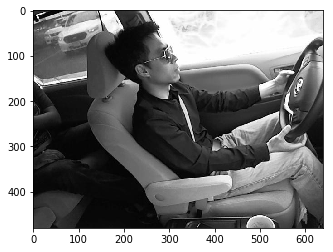

   Prediction =  talking on the phone - left


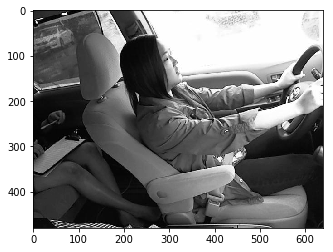

   Prediction =  safe driving


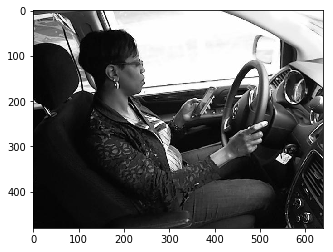

   Prediction =  talking to passenger


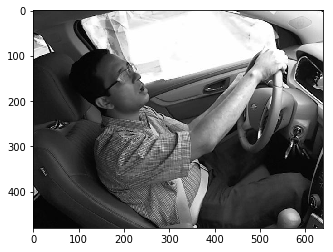

   Prediction =  talking on the phone - right


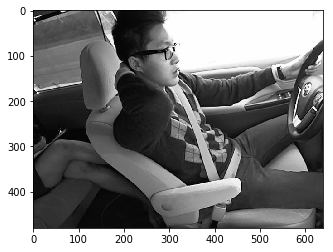

   Prediction =  operating the radio


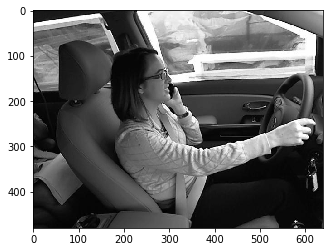

   Prediction =  talking on the phone - left


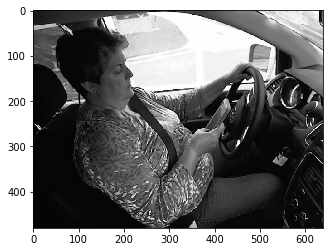

   Prediction =  texting - right


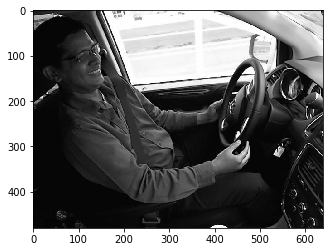

   Prediction =  texting - left


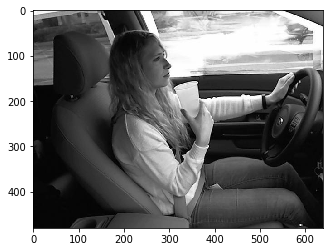

   Prediction =  drinking


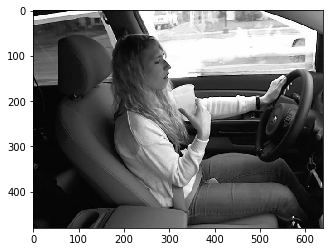

   Prediction =  reaching behind


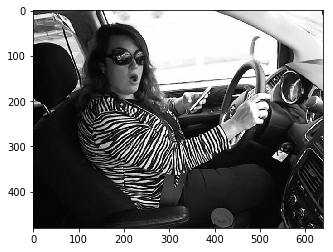

   Prediction =  talking on the phone - left


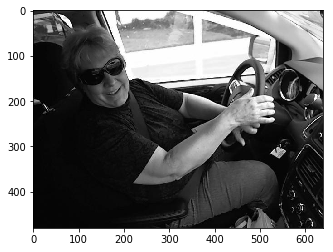

   Prediction =  talking to passenger


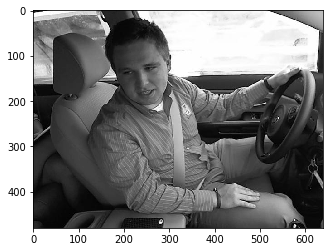

   Prediction =  operating the radio


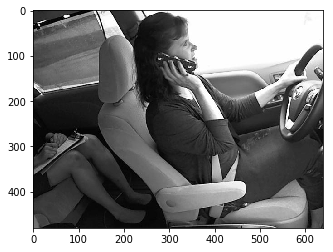

   Prediction =  reaching behind


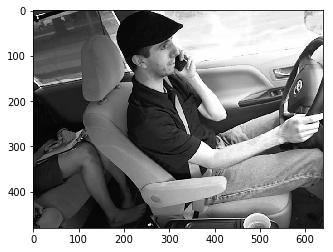

   Prediction =  texting - left


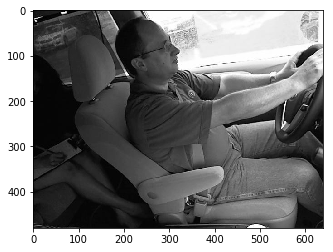

   Prediction =  operating the radio


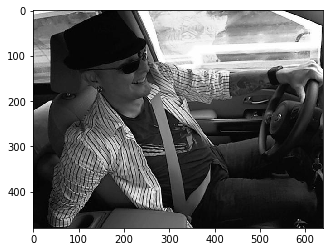

   Prediction =  reaching behind


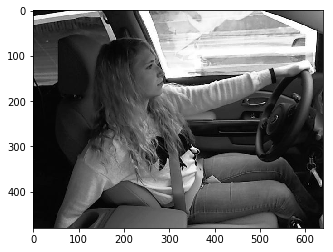

   Prediction =  reaching behind


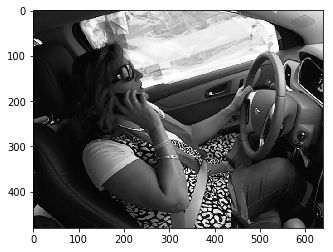

   Prediction =  reaching behind


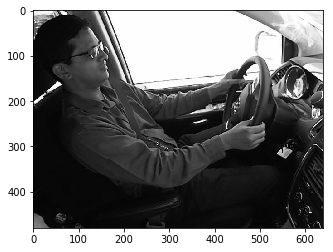

   Prediction =  talking to passenger


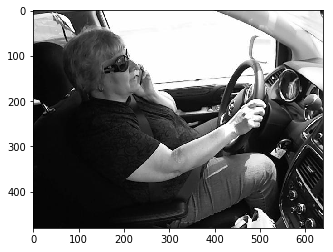

   Prediction =  talking on the phone - left


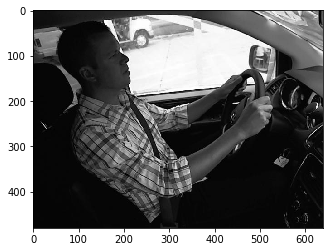

   Prediction =  talking to passenger


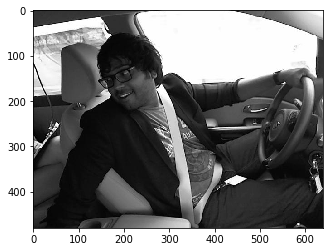

   Prediction =  reaching behind


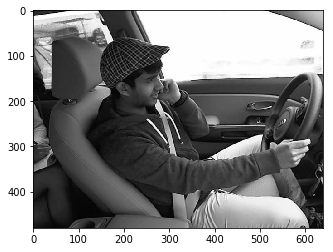

   Prediction =  talking on the phone - left


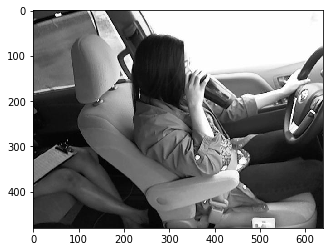

   Prediction =  operating the radio


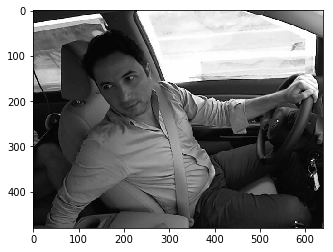

   Prediction =  reaching behind


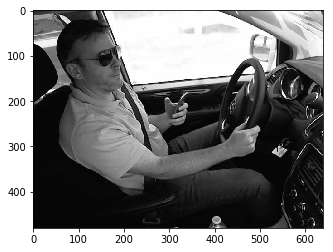

   Prediction =  texting - left


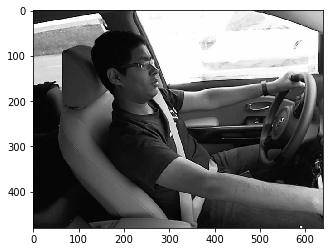

   Prediction =  operating the radio


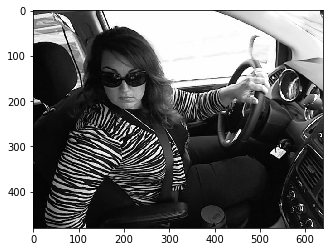

   Prediction =  reaching behind


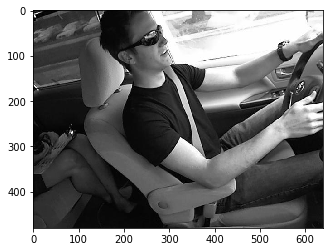

   Prediction =  texting - left


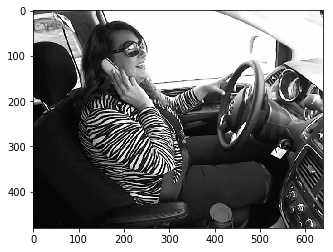

   Prediction =  talking to passenger


In [52]:

import cv2
import tensorflow as tf
categories= [ 'c0','c1','c2','c3','c4','c5','c6','c7','c8','c9']



path='/Users/crisramos/Desktop/Deep Learning/Project FArmerINsurance/imgs/test'# testing path

# classes in order
classes=["safe driving",
         "texting - right"
         ,"talking on the phone - right"
         ,"texting - left"
         ,"talking on the phone - left"
         ,"operating the radio"
         ,"drinking"
         ,"reaching behind"
         ,"hair and makeup"
         ,"talking to passenger"]
c=0
im='img_12.jpg'
for im in os.listdir(path):
    testing_set=[]

    img_arr=cv2.imread(os.path.join(path,im), cv2.IMREAD_GRAYSCALE)
    #img_arr =cv2.resize(img_arr,(300,300))
    testing_set.append(img_arr)
    #img_array=cv2.imread(os.path.join(path,img), cv2.IMREAD_COLOR)
    plt.imshow(img_arr,cmap="gray")
    X_test= []
    for d in testing_set:
        X_test.append(d)
    #plt.imshow(img_array,cmap="gray")
    plt.show()
    X_test= np.array(X_test).reshape(-1, 480,640,1)
    
    #print(os.path.join(path,im))
    prediction=model.predict_classes(X_test)
    #print( "  0 1  2  3  4  5  6  7  8  9")
    print('   Prediction = ',classes[int(prediction)])
    
    c+=1
    if c> 100 :
        break
           
    